# Depth estimation

**Depth estimation** is important because it enables computer vision systems to perceive the world in 3D, rather than in 2D. 

This can improve the performance and accuracy of many tasks, such as object detection, segmentation, tracking, or pose estimation. For example, depth estimation can help to distinguish between foreground and background objects, to locate objects in 3D space, or to estimate their size and shape. Moreover, depth estimation can enhance the realism and immersion of virtual and augmented reality applications, by creating a sense of depth and perspective.

In [2]:
import cv2
import gradio as gr
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import torch

from moviepy.editor import *
from PIL import Image

from transformers import DPTImageProcessor, DPTForDepthEstimation

In [3]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [4]:
def get_device() -> str:
    """
    Get device type - either 'cuda' if GPU is available or 'cpu' otherwise.
    """  
    if torch.cuda.is_available():
        device = "cuda"
        print("GPU is available")
        !nvidia-smi
    else:
        device = "cpu"
        print("No GPU")
    
    return device

In [5]:
get_device()

GPU is available
Wed Jul 26 14:07:31 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.182.03   Driver Version: 470.182.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           On   | 00000001:00:00.0 Off |                    0 |
| N/A   39C    P8    26W / 149W |      3MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla K80           On   | 00000002:00:00.0 Off |               

'cuda'

In [6]:
RESULT_DIR = "results"

os.makedirs(RESULT_DIR, exist_ok=True)

## Processing images

In [7]:
dptmodel = "Intel/dpt-large"  # or "Intel/dpt-hybrid-midas"

processor = DPTImageProcessor.from_pretrained(dptmodel)
model = DPTForDepthEstimation.from_pretrained(dptmodel)

Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [8]:
def depth_estimation(image_file: str) -> None:
    """
    Depth estimation function.

    Input:
        image_file (str): Path to the image file.

    Output:
        None. (Saves depth image and displays side-by-side images)
    """
    # Reading the local image
    img = Image.open(image_file)

    # prepare image for the model
    inputs = processor(images=img, return_tensors="pt")

    with torch.no_grad():
        outputs = model(**inputs)
        predicted_depth = outputs.predicted_depth

    # interpolate to original size
    prediction = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=img.size[::-1],
        mode="bicubic",
        align_corners=False,
    )

    # visualize the prediction
    output = prediction.squeeze().cpu().numpy()
    formatted = (output * 255 / np.max(output)).astype("uint8")
    depth = Image.fromarray(formatted)

    # Saving the depth into an image file
    depth_image = os.path.join(RESULT_DIR, "depth_" + os.path.basename(image_file))
    depth.save(depth_image, "PNG")

    # Viewing the images side by side
    img1 = plt.imread(image_file)
    img2 = plt.imread(depth_image)
    f, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].imshow(img1)
    ax[1].imshow(img2, cmap="viridis")
    ax[0].set_title("Input image: " + image_file)
    ax[1].set_title("Depth image: " + depth_image)
    title = "Depth estimation"
    f.suptitle(title, fontsize=20)
    plt.tight_layout()
    plt.show()

## Testing

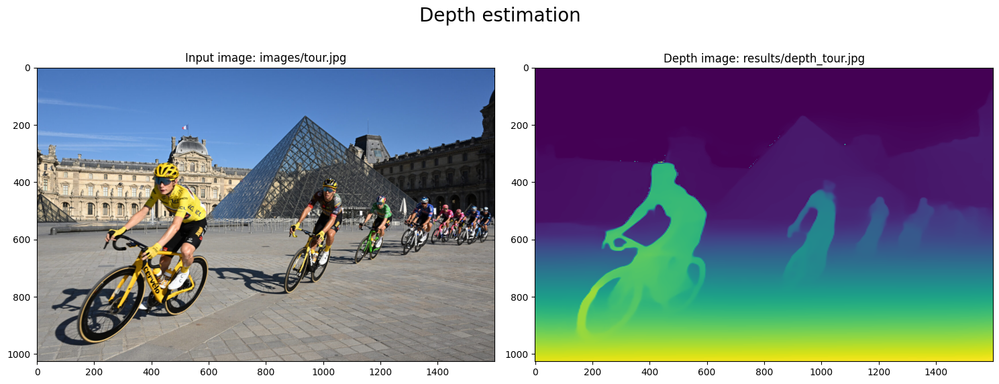

In [9]:
imagefile = "images/tour.jpg"
depth_estimation(imagefile)

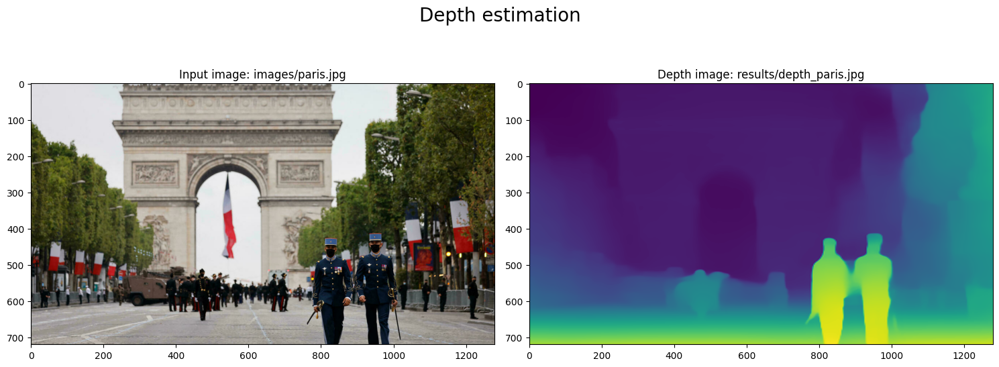

In [10]:
imagefile = "images/paris.jpg"
depth_estimation(imagefile)

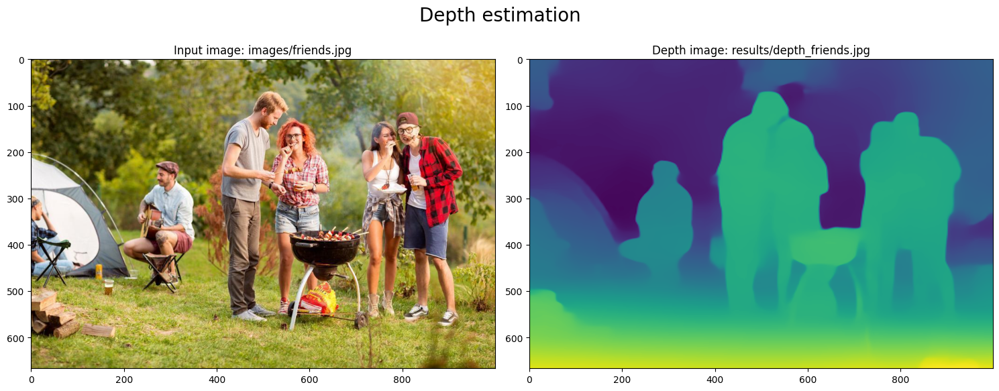

In [11]:
imagefile = "images/friends.jpg"
depth_estimation(imagefile)

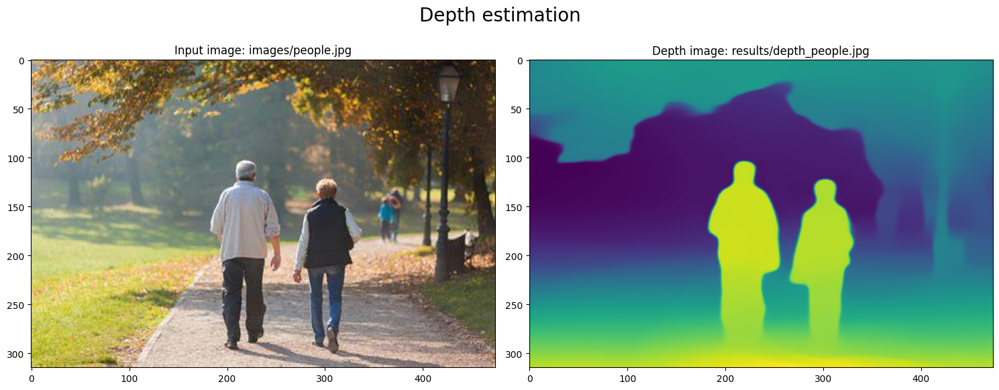

In [12]:
imagefile = "images/people.jpg"
depth_estimation(imagefile)

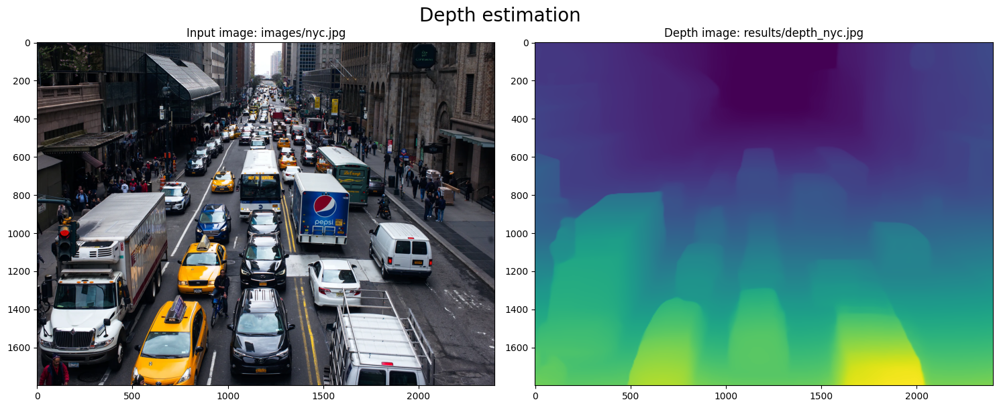

In [13]:
imagefile = "images/nyc.jpg"
depth_estimation(imagefile)

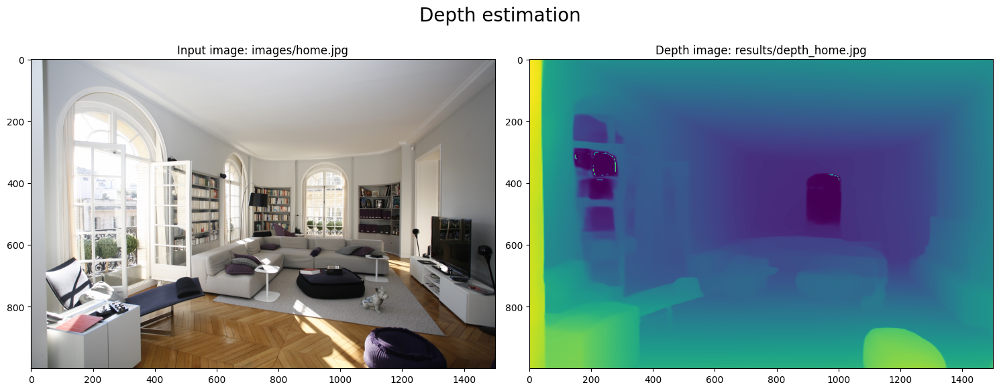

In [14]:
imagefile = "images/home.jpg"
depth_estimation(imagefile)

## 2. Video processing

In [15]:
def get_video_duration(videofile: str) -> float:
    """
    Get the video duration.

    Args:
        videofile (str): The path of the video file.

    Returns:
        float: The duration of the video in seconds.
    """
    vid = VideoFileClip(videofile)
    duration = vid.duration

    return duration

In [16]:
def get_video_nbframes(videofile: str) -> int:
    """
    Get the number of frames from a video.

    Args:
        videofile (str): The path to the video file.

    Returns:
        int: The number of frames in the video.
    """
    vid = cv2.VideoCapture(videofile)
    nbframes = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))

    return nbframes

In [17]:
def depth_video(frame: np.ndarray) -> np.ndarray:
    """
    Depth estimation function.

    Args:
        frame (numpy.ndarray): Input image frame.

    Returns:
        numpy.ndarray: Depth image frame.
    """
    # Processing the frame
    img = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    # Running the depth estimation
    inputs = processor(images=img, return_tensors="pt")

    with torch.no_grad():
        outputs = model(**inputs)
        predicted_depth = outputs.predicted_depth

    prediction = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=img.size[::-1],
        mode="bicubic",
        align_corners=False,
    )

    output = prediction.squeeze().cpu().numpy()
    formatted = (output * 255 / np.max(output)).astype("uint8")
    depth_img = cv2.cvtColor(np.array(Image.fromarray(formatted)), cv2.COLOR_RGB2BGR)

    return depth_img

### Testing

In [18]:
VIDEO_DIR = "video"

input_video_file = os.path.join(VIDEO_DIR, "video.mp4")
output_video_file = os.path.join(VIDEO_DIR, "depth_video.mp4")
combined_video_file = os.path.join(VIDEO_DIR, "combined.mp4")

In [19]:
!ls {input_video_file} -lh

-rwxrwxrwx 1 root root 9.6M Jun 13 15:05 video/video.mp4


In [20]:
print("Video file:", input_video_file)

duration = get_video_duration(input_video_file)
print("Video length:", duration, "seconds")

nbframes = get_video_nbframes(input_video_file)
print("Number of frames =", nbframes)

fps = int(nbframes / duration)
print("FPS =", fps)

Video file: video/video.mp4
Video length: 19.37 seconds
Number of frames = 581
FPS = 29


In [21]:
def process_video(input_video_file: str, output_video_file: str) -> str:
    """
    Depth estimation function for video.

    Parameters:
        input_video_file (str): Path to the input video file.
        output_video_file (str): Path to the output depth video file.

    Returns:
        str: Path to the processed depth video file.
    """
    # Open the input video file for reading
    video_capture = cv2.VideoCapture(input_video_file)

    # Get the video properties
    frame_width = int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = video_capture.get(cv2.CAP_PROP_FPS)
    nbframes = get_video_nbframes(input_video_file)

    # Printing
    print("Processing video file:", input_video_file, "\n")

    idx = 0

    # Create a VideoWriter object to save the processed frames
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # Codec for the output video file
    output_video = cv2.VideoWriter(
        output_video_file, fourcc, fps, (frame_width, frame_height)
    )

    # Read and process each frame in the video
    while video_capture.isOpened():
        ret, frame = video_capture.read()

        if not ret:
            break

        # Getting the depth estimation
        depthframe = depth_video(frame)
        # Applying color filter
        heatmap = cv2.applyColorMap(depthframe, cv2.COLORMAP_VIRIDIS)
        # Saving to the video file
        output_video.write(heatmap)

        if idx % int(fps) == 1:
            print("Total number of processed frames:", idx, "/", nbframes)

        idx += 1

        if cv2.waitKey(1) & 0xFF == ord("q"):
            break

    # Release
    video_capture.release()
    output_video.release()

    print("\nDone. Processed file:", output_video_file)

    return output_video_file

In [22]:
output_video_file = process_video(input_video_file, output_video_file)

Processing video file: video/video.mp4 

Total number of processed frames: 1 / 581
Total number of processed frames: 31 / 581
Total number of processed frames: 61 / 581
Total number of processed frames: 91 / 581
Total number of processed frames: 121 / 581
Total number of processed frames: 151 / 581
Total number of processed frames: 181 / 581
Total number of processed frames: 211 / 581
Total number of processed frames: 241 / 581
Total number of processed frames: 271 / 581
Total number of processed frames: 301 / 581
Total number of processed frames: 331 / 581
Total number of processed frames: 361 / 581
Total number of processed frames: 391 / 581
Total number of processed frames: 421 / 581
Total number of processed frames: 451 / 581
Total number of processed frames: 481 / 581
Total number of processed frames: 511 / 581
Total number of processed frames: 541 / 581
Total number of processed frames: 571 / 581

Done. Processed file: video/depth_video.mp4


In [25]:
# Reading videos
inputvid = VideoFileClip(input_video_file).margin(5)
resultvid = VideoFileClip(output_video_file).margin(5)
# Combined videos
combinedvid = clips_array([[inputvid], [resultvid]])
# Saving the combined video
combinedvid.write_videofile(combined_video_file)

Moviepy - Building video video/combined.mp4.
Moviepy - Writing video video/combined.mp4



Moviepy - Done !
Moviepy - video ready video/combined.mp4


In [31]:
# Viewing combined video
combinedvid.subclip(5, 15).ipython_display(height=640)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [28]:
!ls $VIDEO_DIR/*.mp4 -lh

-rwxrwxrwx 1 root root 5.3M Jul 26 14:28 video/combined.mp4
-rwxrwxrwx 1 root root 2.7M Jul 26 14:09 video/depth_video.mp4
-rwxrwxrwx 1 root root 9.6M Jun 13 15:05 video/video.mp4


## 3. Gradio web app

In [29]:
def depth_function_webapp(img: Image) -> Image:
    """
    Depth estimation function for Gradio webapp
    Input: PIL image
    Output: PIL image
    """
    # Prepare inputs
    inputs = processor(images=img, return_tensors="pt")

    with torch.no_grad():
        # Perform depth estimation
        outputs = model(**inputs)
        predicted_depth = outputs.predicted_depth

    # Interpolate the predicted depth to match the original image size
    prediction = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=img.size[::-1],
        mode="bicubic",
        align_corners=False,
    )

    # Applying the color map
    output = prediction.squeeze().cpu().numpy()
    formatted = (output * 255 / np.max(output)).astype("uint8")
    colormap = cm.get_cmap("viridis")
    colored_output = colormap(formatted)

    # Create a PIL image object from the colored array
    depth = Image.fromarray((colored_output * 255).astype("uint8"))

    return depth

In [30]:
logo = "https://github.com/retkowsky/images/blob/master/logoazureCV.png?raw=true"
image = "<center> <img src= {} width=50px></center>".format(logo)
title = "Depth estimation"
examples = [
    "images/tour.jpg",
    "images/home.jpg",
    "images/friends.jpg",
    "images/nyc.jpg",
    "images/paris.jpg",
    "images/people.jpg",
]

# Define Gradio interface
inputs = gr.Image(type="pil", label="Input Image")
outputs = [
    gr.Image(label="Depth image", type="pil"),
]

# Gradio Webapp definition
depth_webapp = gr.Interface(
    depth_function_webapp,  # funtion to use
    inputs,  # image to analyse
    outputs,  # depth pil image
    title=title,  # header title
    description=image,  # logo
    examples=examples,  # samples
    theme="gstaff/xkcd",  # https://huggingface.co/spaces/gradio/theme-gallery
)

# Running the gradio webapp
depth_webapp.launch(share=True)

Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://1bb0614b446f150d50.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
